# Vehicle Detection and Tracking Project

### Read training and testing data

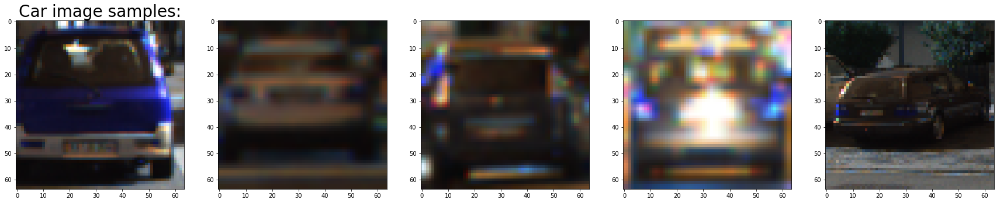

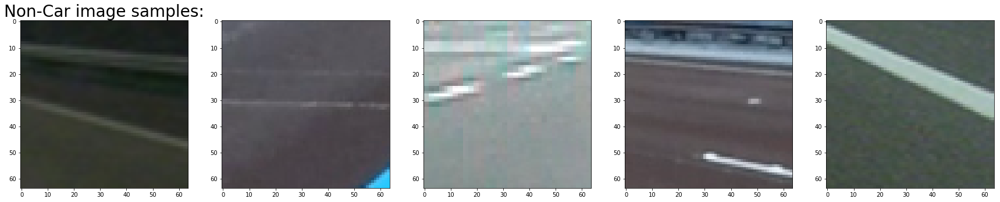

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
%matplotlib inline

vehicle_images_path = shuffle(glob.glob('./vehicles/*/*.png'))
non_vehicle_images_path = shuffle(glob.glob('./non-vehicles/*/*.png'))

sample_vehicle_images = []
sample_non_vehicle_images = []
fig1 = plt.figure()

for i in range(5):
    sample_vehicle_images.append(cv2.imread(vehicle_images_path[i]))
    fig1.add_subplot(1, 5, i+1)
    if i == 0:
        plt.title('Car image samples:', fontsize=28)
    plt.imshow(sample_vehicle_images[i])
fig1.set_size_inches(np.array(fig1.get_size_inches()) * 5)
plt.show()

fig2 = plt.figure()
for i in range(5):
    sample_non_vehicle_images.append(cv2.imread(non_vehicle_images_path[i]))
    fig2.add_subplot(1, 5, i+1)
    if i == 0:
        plt.title('Non-Car image samples:', fontsize=28)
    plt.imshow(sample_non_vehicle_images[i])
fig2.set_size_inches(np.array(fig2.get_size_inches()) * 5)
plt.show()



### Implement HOG feature extraction

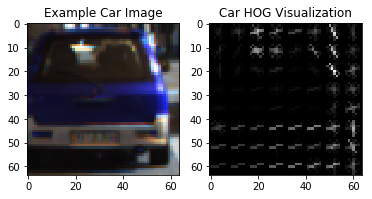

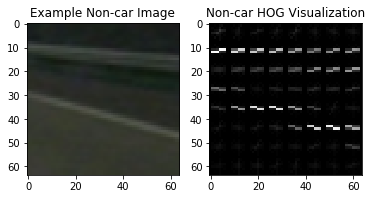

In [2]:
from skimage.feature import hog

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  block_norm= 'L2-Hys',
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       block_norm= 'L2-Hys',
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

image = sample_vehicle_images[0]
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
features, hog_image = get_hog_features(
    gray, orient= 9, pix_per_cell= 8, cell_per_block= 2, vis=True, feature_vec=False)

# Plot the car examples
car_hog_fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('Car HOG Visualization')

image = sample_non_vehicle_images[0]
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
features, hog_image = get_hog_features(
    gray, orient= 9, pix_per_cell= 8, cell_per_block= 2, vis=True, feature_vec=False)

# Plot the non-car examples
non_car_hog_fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Non-car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('Non-car HOG Visualization')

### Implement color feature extraction

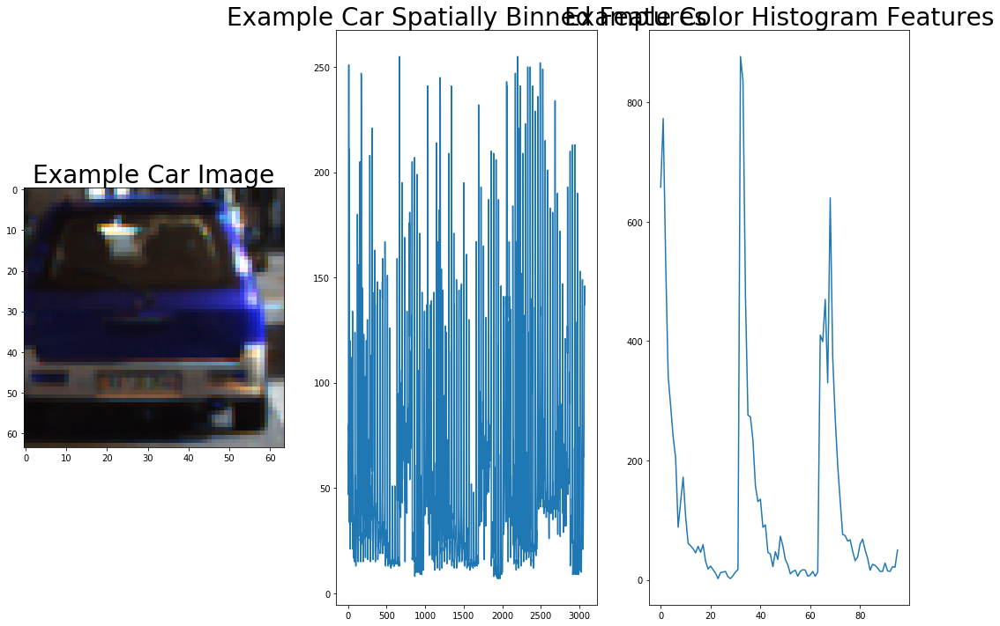

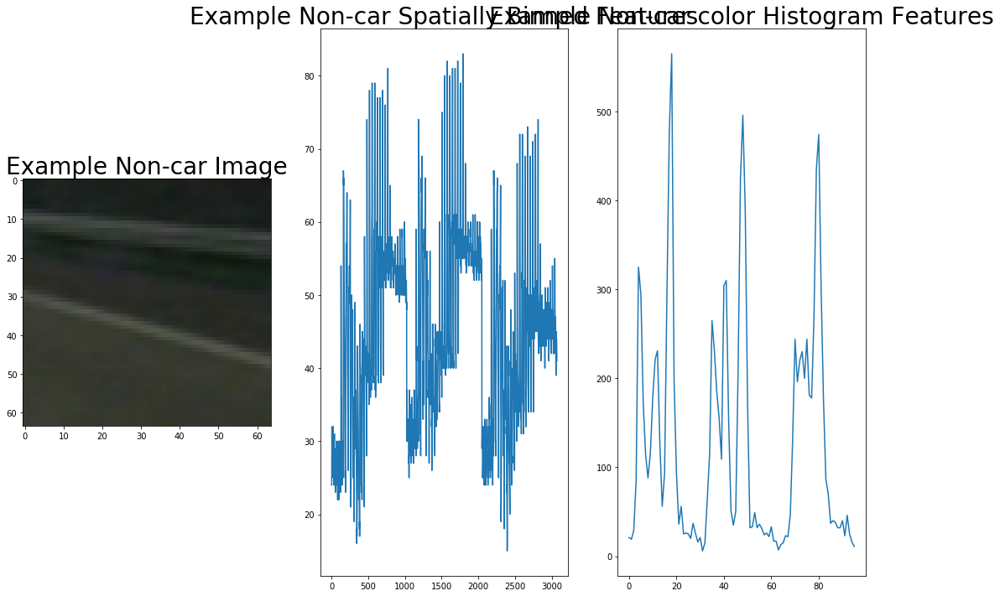

In [3]:
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

image = sample_vehicle_images[0]
feature_vec = bin_spatial(image)
color_hist_feature = color_hist(image)


# Plot the car examples
car_color_fig = plt.figure()
car_color_fig.set_size_inches(np.array(car_hog_fig.get_size_inches()) * 3)
plt.subplot(131)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image', fontsize=28)
plt.subplot(132)
plt.plot(feature_vec)
plt.title('Example Car Spatially Binned Features', fontsize=28)
plt.subplot(133)
plt.plot(color_hist_feature)
plt.title('Example Color Histogram Features', fontsize=28)

image = sample_non_vehicle_images[0]
feature_vec = bin_spatial(image)
color_hist_feature = color_hist(image)


# Plot the non-car examples
non_car_color_fig = plt.figure()
non_car_color_fig.set_size_inches(np.array(car_hog_fig.get_size_inches()) * 3)
plt.subplot(131)
plt.imshow(image, cmap='gray')
plt.title('Example Non-car Image', fontsize=28)
plt.subplot(132)
plt.plot(feature_vec)
plt.title('Example Non-car Spatially Binned Features', fontsize=28)
plt.subplot(133)
plt.plot(color_hist_feature)
plt.title('Example Non-car color Histogram Features', fontsize=28)


### Concatnate binned color feature and histograms of color and HOG

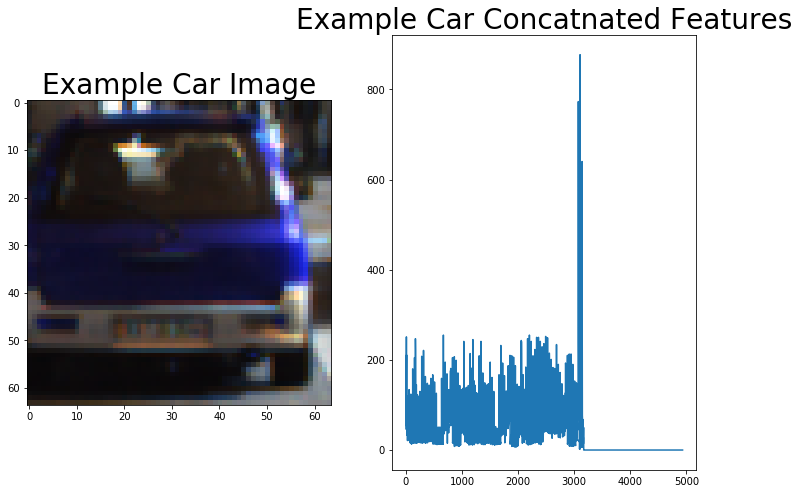

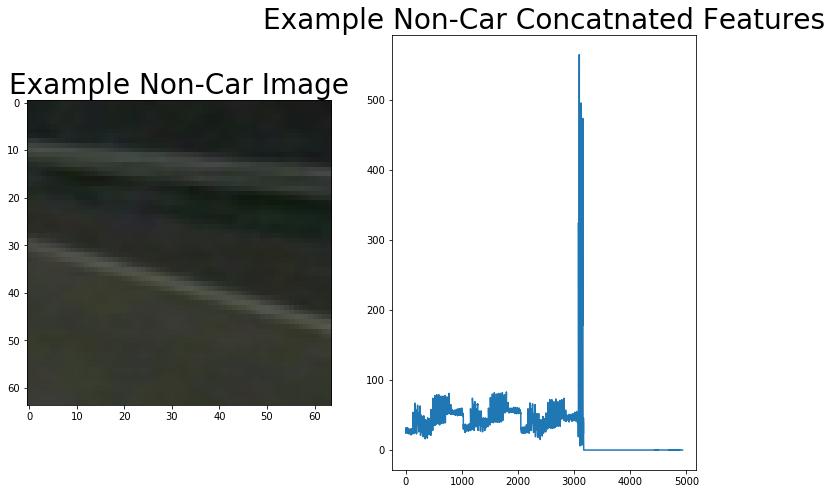

In [4]:
def concatnate_features(hog_features, image, size=(32, 32), nbins=32):
    spatial_features = bin_spatial(image, size=size)
    hist_features = color_hist(image, nbins=nbins)
    features = np.concatenate([spatial_features, hist_features, hog_features])
    return features

image = sample_vehicle_images[0]
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hog_features = get_hog_features(
    gray, orient= 9, pix_per_cell= 8, cell_per_block= 2, vis=False, feature_vec=True)
concatnated_features = concatnate_features(hog_features, image)

# Plot the car examples
car_color_fig = plt.figure()
car_color_fig.set_size_inches(np.array(car_hog_fig.get_size_inches()) * 2)
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image', fontsize=28)
plt.subplot(122)
plt.plot(concatnated_features)
plt.title('Example Car Concatnated Features', fontsize=28)


image = sample_non_vehicle_images[0]
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hog_features = get_hog_features(
    gray, orient= 9, pix_per_cell= 8, cell_per_block= 2, vis=False, feature_vec=False).ravel()
concatnated_features = concatnate_features(hog_features, image)


# Plot the non-car examples
non_car_color_fig = plt.figure()
non_car_color_fig.set_size_inches(np.array(car_hog_fig.get_size_inches()) * 2)
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Non-Car Image', fontsize=28)
plt.subplot(122)
plt.plot(concatnated_features)
plt.title('Example Non-Car Concatnated Features', fontsize=28)


### Normalize feature and randomize data set

In [5]:
vehicle_images = []
non_vehicle_images = []

for path in vehicle_images_path:
    vehicle_images.append(cv2.imread(path))
for path in non_vehicle_images_path:
    non_vehicle_images.append(cv2.imread(path))

In [6]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for image in imgs:
        file_features = []
        feature_image = image
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

color_space = 'HSV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 4 # HOG cells per block
hog_channel = 1 # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
car_features = extract_features(vehicle_images, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(non_vehicle_images, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import StandardScaler

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

/usr/local/google/home/pkuyuewen/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


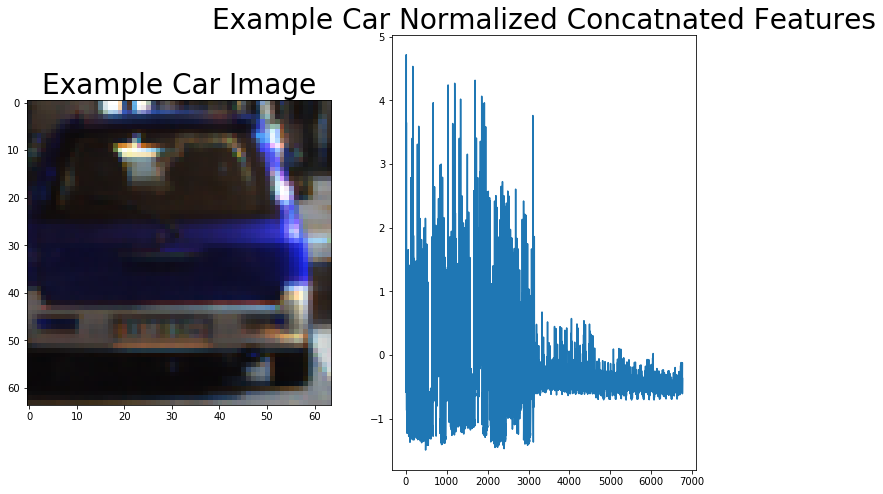

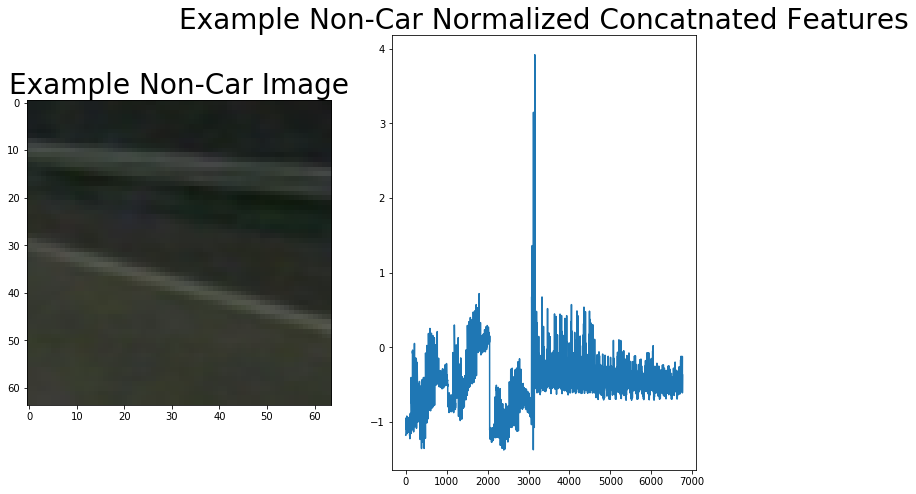

In [7]:
image = sample_vehicle_images[0]
feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
hog_features = get_hog_features(
    feature_image[:,:,1], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True)
concatnated_features = concatnate_features(hog_features, image)
normalized_concatnated_features = X_scaler.transform(np.array([concatnated_features]))

# Plot the car examples
car_color_fig = plt.figure()
car_color_fig.set_size_inches(np.array(car_hog_fig.get_size_inches()) * 2)
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image', fontsize=28)
plt.subplot(122)
plt.plot(normalized_concatnated_features[0])
plt.title('Example Car Normalized Concatnated Features', fontsize=28)


image = sample_non_vehicle_images[0]
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
hog_features = get_hog_features(
    feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True)
concatnated_features = concatnate_features(hog_features, image)
normalized_concatnated_features = X_scaler.transform(np.array([concatnated_features]))


# Plot the non-car examples
non_car_color_fig = plt.figure()
non_car_color_fig.set_size_inches(np.array(car_hog_fig.get_size_inches()) * 2)
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Non-Car Image', fontsize=28)
plt.subplot(122)
plt.plot(normalized_concatnated_features[0])
plt.title('Example Non-Car Normalized Concatnated Features', fontsize=28)

### Train linear SVM classifier

In [8]:
import time
from sklearn.svm import LinearSVC

# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

25.31 Seconds to train SVC...
Test Accuracy of SVC =  0.971


### Implement sliding window and search vechicles

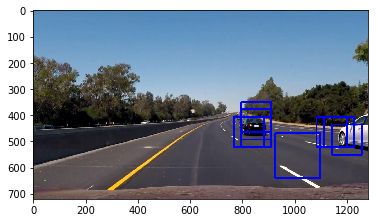

In [9]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    # Here we slightly from the code in the class, we cut the x from 450, since we realize the left side is uselss.
    # Besides, the relative speed from the left side is much faster than right, it takes more false positive cases.
    x_start = 450
    bboxes = []
    draw_img = np.copy(img)
    img_tosearch = img[ystart:ystop,x_start:,:]
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    # Define blocks and steps as above
    nxblocks = (ctrans_tosearch.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ctrans_tosearch.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog = get_hog_features(
        ctrans_tosearch[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat = hog[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.array(hog_feat)

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                bboxes.append(((xbox_left+x_start, ytop_draw+ystart),(xbox_left+x_start+win_draw,ytop_draw+win_draw+ystart)))
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(255,0,0),6) 
                
    return draw_img, bboxes

# We have an additional parameter nrounds, here, means how many sub space we will devide the search area.
def find_car_with_multiple_scales(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, nrounds=3):
    draw_img = np.copy(img)
    # We multiplify 3 here, makes each search area 50% overlap.
    interval_per_round = int((ystop-ystart)/nrounds*1.5)
    current_start = ystart
    bboxes = []
    for n in range(nrounds):
        scale *= 1.5
        _, intermediate_bboxes = find_cars(img, current_start, min(ystop, current_start+interval_per_round), scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        bboxes += [intermediate_bboxes]
        current_start += int((ystop-ystart)/nrounds*(0.5 + n))
    for bboxes_in_cetrain_size in bboxes:
        for bbox in bboxes_in_cetrain_size:
            cv2.rectangle(draw_img,bbox[0],bbox[1],(255,0,0),6)
    return draw_img, bboxes
        
#img = cv2.imread('./test_images/test1.jpg')
img = cv2.imread('./video_frame_14.jpg')
ystart = 350
ystop = 650
scale = 1.2
nrounds=2
out_img, _ = find_car_with_multiple_scales(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, nrounds)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))

### Create heatmap and estimate bounding boxes

In [10]:
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list, weight=1):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += weight

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    heatmap[heatmap > threshold] = 1
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    bboxes = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        if min(bbox[1][0] - bbox[0][0],bbox[1][1] - bbox[0][1]) > 60:
            bboxes.append(bbox)
        # Draw the box on the image
            cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img, bboxes

class CarsDetector():
    def __init__(self):
        self.memory_size = 15
        self.recent_bboxes = []
        self.heatmap = None
        self.processed_image = None
    def detect_car(self, img):
        current_final_bboxes = []
        self.processed_image = np.copy(img)
        _, bboxes = find_car_with_multiple_scales(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, nrounds)
        self.recent_bboxes.append(bboxes)
        if len(self.recent_bboxes) > self.memory_size:
            self.recent_bboxes = self.recent_bboxes[1:]
        for i in range(nrounds):
            heat = np.zeros_like(img[:,:,0]).astype(np.float)
            # We only count heat map for same scale of bboxes.
            weight = 1
            for bboxes_in_one_frame in self.recent_bboxes:
                heat = add_heat(heat*0.6,bboxes_in_one_frame[i], weight)
                # Make sure first several frames will not have too big treshold
            if len(self.recent_bboxes) > 5:
                heat_current = apply_threshold(heat, 3)
            else:
                heat_current = apply_threshold(heat, 2)
            heatmap_current = np.clip(heat_current, 0, 255)
            labels = label(heatmap_current)
            _, temp_bboxes = draw_labeled_bboxes(self.processed_image, labels)
            
            #heat_for_future_use = apply_threshold(heat, 1.8)
            #heatmap_for_future_use = np.clip(heat_for_future_use, 0, 255)
            #labels = label(heatmap_for_future_use)
            #_, temp_bboxes = draw_labeled_bboxes(self.processed_image, labels)
            current_final_bboxes += [temp_bboxes]
        self.recent_bboxes[-1] = current_final_bboxes
    
        self.processed_image = np.copy(img)
        for i in range(nrounds):
            heat = np.zeros_like(img[:,:,0]).astype(np.float)
            # We only count heat map for same scale of bboxes.
            weight = 0
            for bboxes_in_one_frame in self.recent_bboxes:
                weight += float(1/len(self.recent_bboxes))
                heat = add_heat(heat,bboxes_in_one_frame[i], weight)
                # Make sure first several frames will not have too big treshold
            heat_current = apply_threshold(heat, max(len(self.recent_bboxes)/2, 2))
            heatmap_current = np.clip(heat_current, 0, 255)
            labels = label(heatmap_current)
            self.processed_image, _ = draw_labeled_bboxes(self.processed_image, labels)
        


### Run for video

In [11]:
from moviepy.editor import VideoFileClip

cars_detector = CarsDetector()
def process_video_image(img):
    cars_detector.detect_car(img)
    return cars_detector.processed_image

# The following 
#video_input = './project_video.mp4'
#video_output = './test_clip2.mp4'
#clip1 = VideoFileClip(video_input)
#video_clip = clip1.subclip(25, 30)
#video_clip.write_videofile(video_output, audio=False)
# Generate test images for tuning use.
#for i in range(20):
#    filename = './video_frame_' + str(i) + '.jpg'
#    time = 45 + float(i/10)
#    clip1.save_frame(filename, t=time)

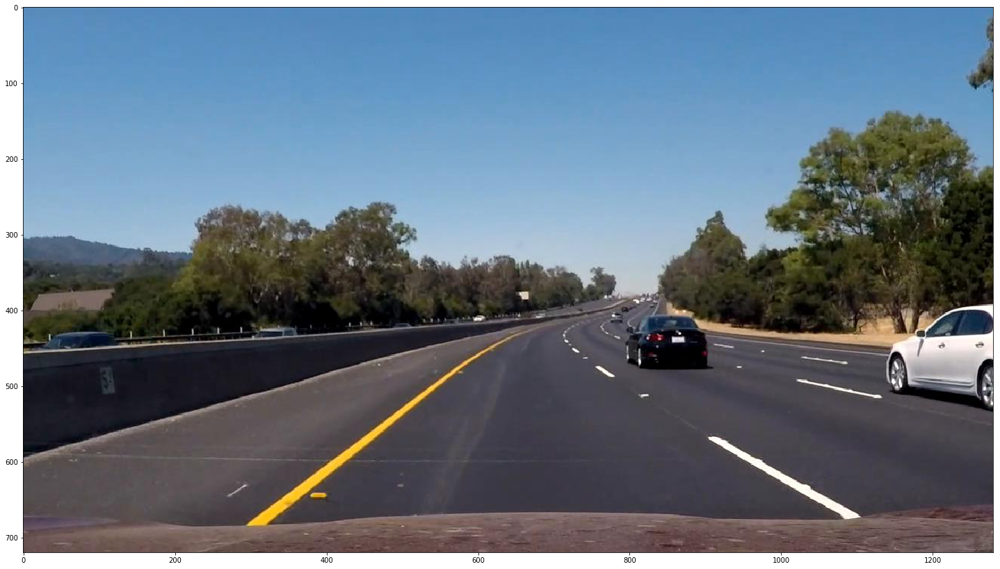

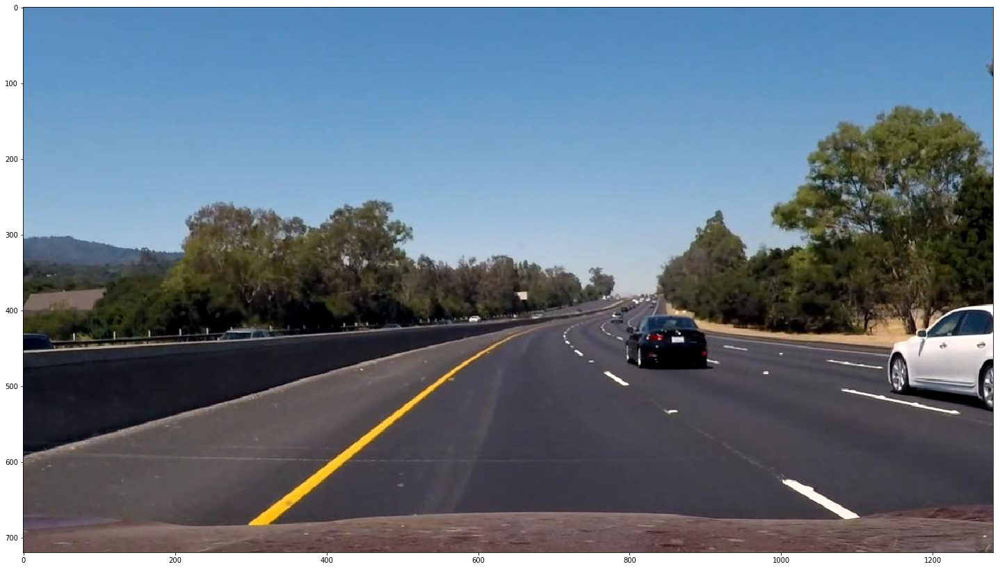

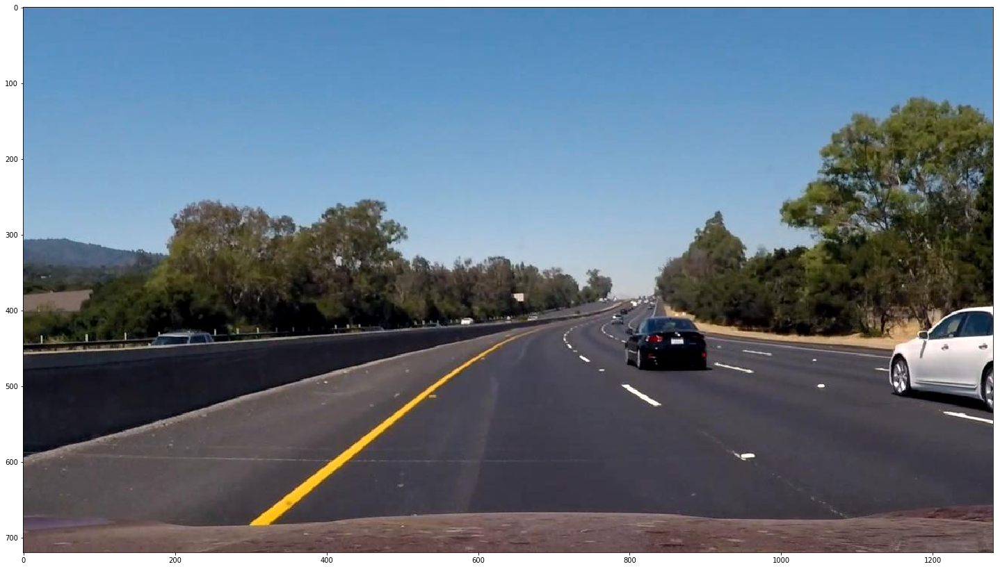

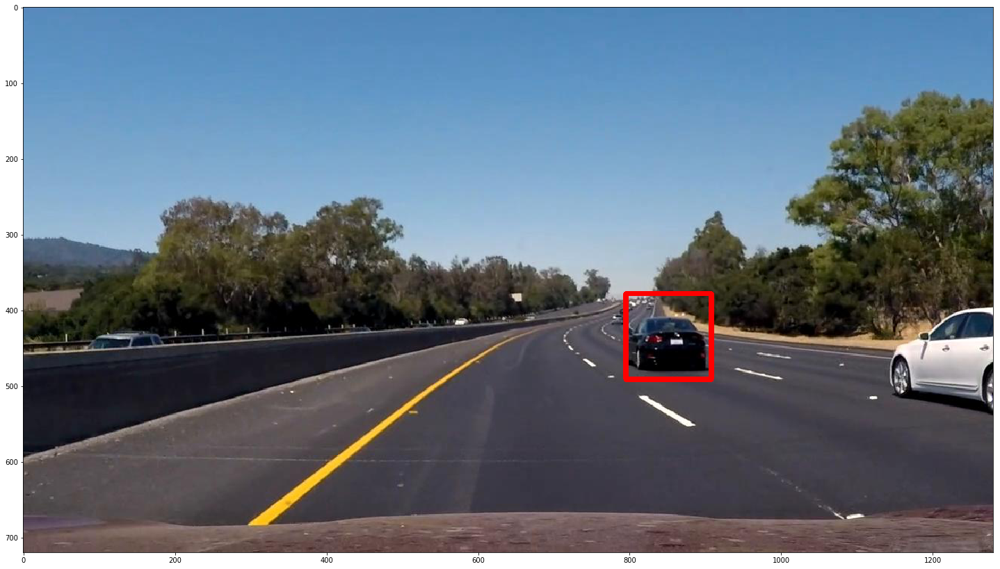

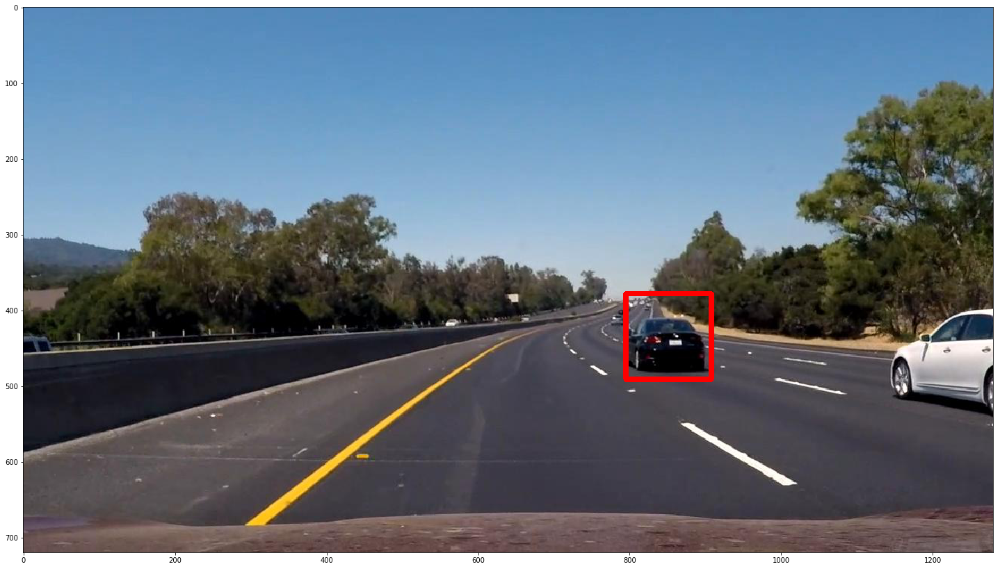

...

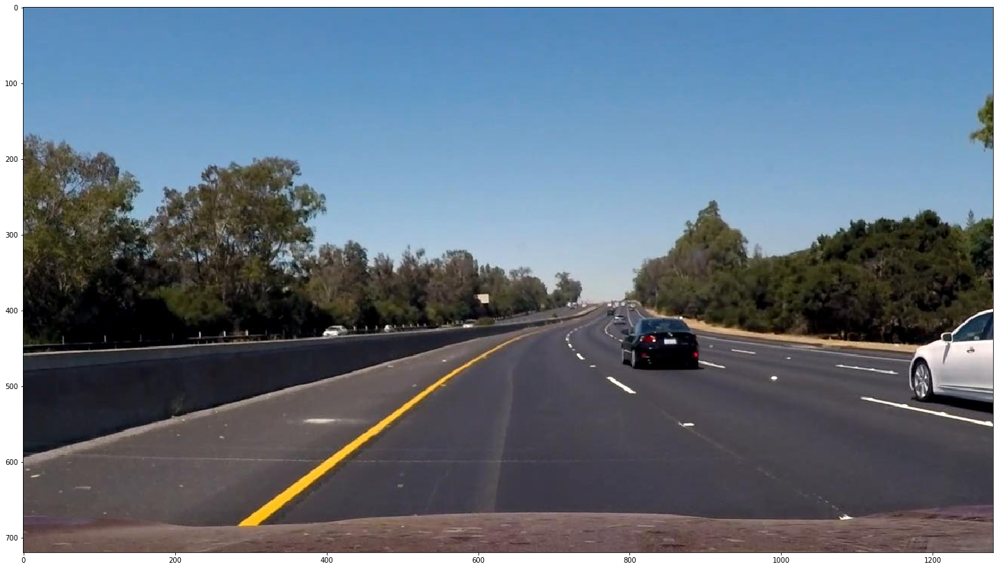

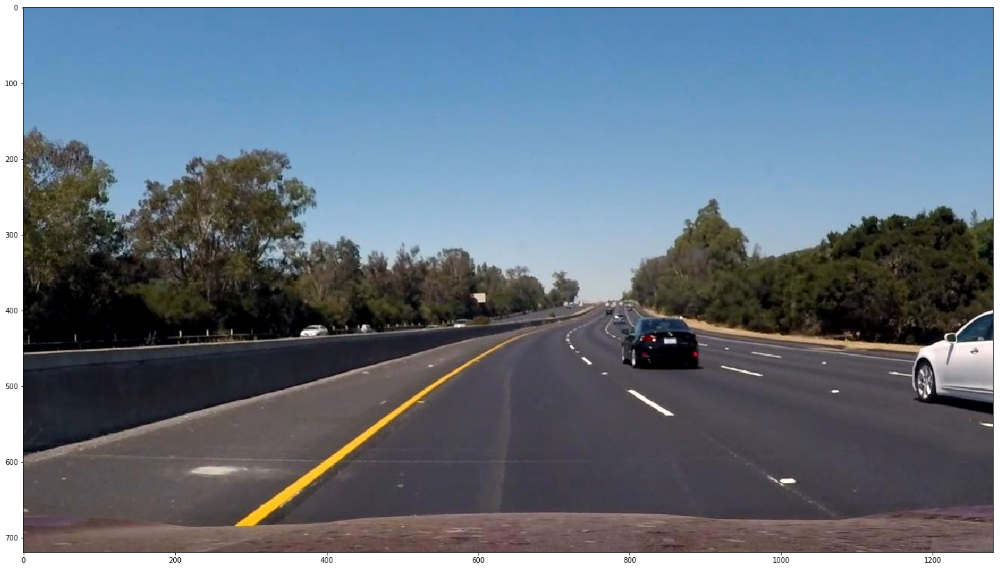

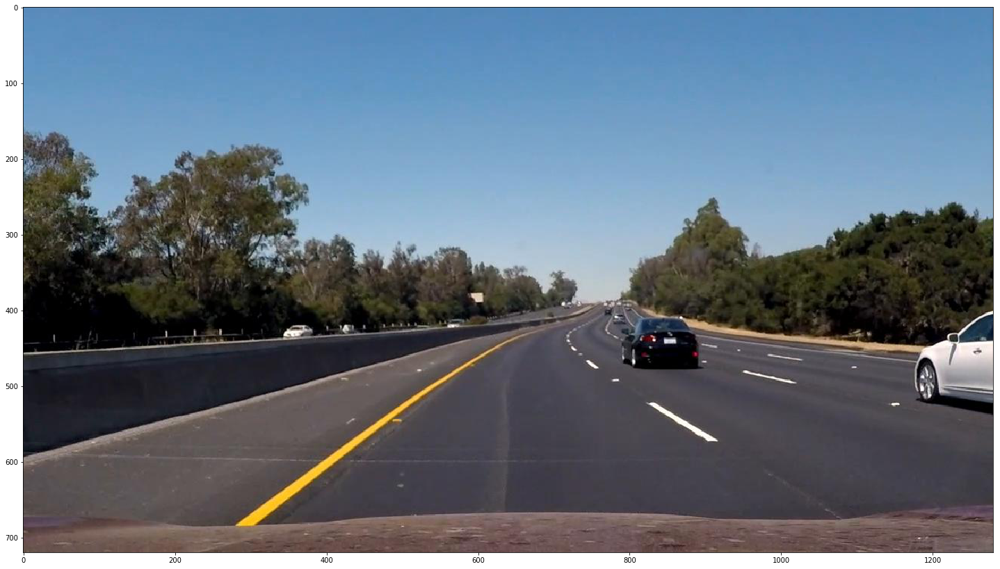

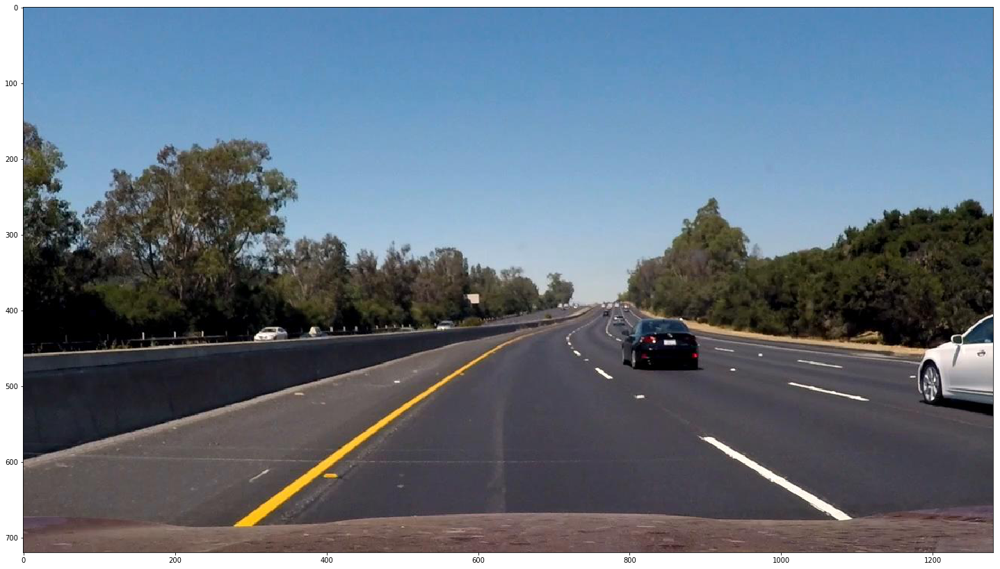

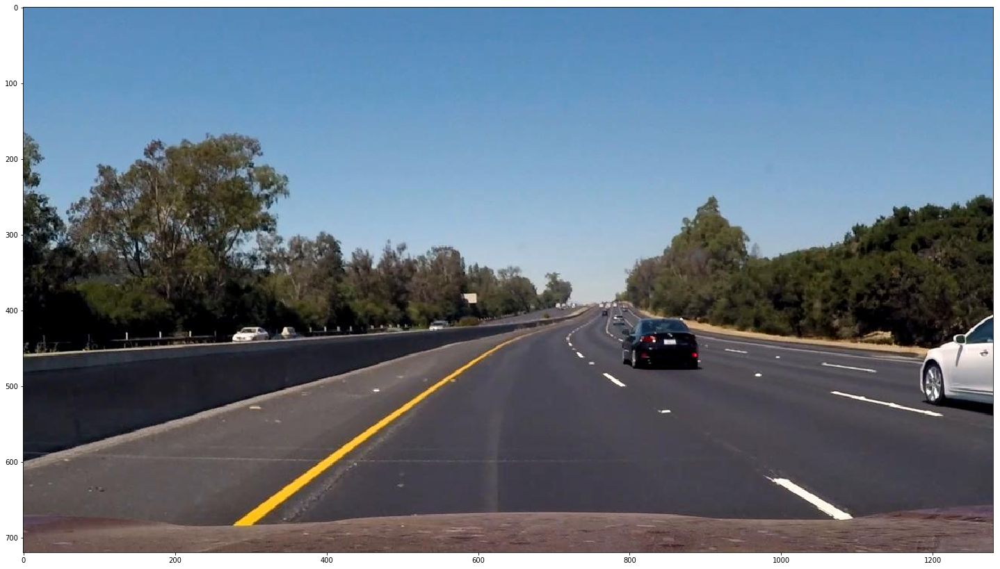

In [12]:
cars_detector = CarsDetector()
for i in range(20):
    filename = './video_frame_' + str(i) + '.jpg'
    img = cv2.imread(filename)
    cars_detector.detect_car(img)
    f, ax = plt.subplots(1, 1, figsize=(25,25))
    ax.imshow(cv2.cvtColor(cars_detector.processed_image, cv2.COLOR_BGR2RGB))
    plt.subplots_adjust(wspace=0, hspace=0)



In [13]:
cars_detector = CarsDetector()

#video_input = './test_clip1.mp4'
#video_output = './test_result1.mp4'
video_input = './project_video.mp4'
video_output = './project_result.mp4'
clip1 = VideoFileClip(video_input)
video_clip = clip1.fl_image(process_video_image)
video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ./project_result.mp4
[MoviePy] Writing video ./project_result.mp4


100%|█████████▉| 1260/1261 [04:32<00:00,  4.73it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_result.mp4 

